# Time-frequency analysis (M4) — MET004TESTBLUE, R01

Walks through every M4 feature for channels **Oz** and **O1**, 20 stimulus trials:

1. Raw time-frequency maps, no normalization — grid of trials.
2. Baseline: mean time-frequency representation, and the scalar baseline used for normalization.
3. Per-pixel baseline normalization — percent change, dB, and natural-log ratio — grid of trials, for each channel.
4. Frequency-collapsed time courses at 10 Hz (exact bin) and 9–11 Hz (range mean) — per-trial grid and all-trials overlay, for every (channel, method) combination.

All spectrogram/heatmap plots accept `cmap`/`vmin`/`vmax` overrides if you want different colors than the defaults used here.

In [1]:
from pathlib import Path

import numpy as np

from eeg.eeglab_io import BASELINE_EVENT_ID, load_eeglab_epochs
from eeg.psd import band_power
from eeg.timefreq import baseline_normalize, compute_baseline_stats, time_frequency_decompose
from eeg.viz import (
    plot_tf_grid,
    plot_time_course_grid,
    plot_time_course_overlay,
    plot_time_frequency,
)

CHANNELS = ["Oz", "O1"]
METHODS = ["percent", "db", "log"]
FREQ_DEFS = [("10 Hz", 10.0), ("9\u201311 Hz", (9.0, 11.0))]

In [2]:
DATA_ROOT = Path("/mnt/c/Users/zevaz/OneDrive/Escritorio/Metamers/eegExp/compsRem")
PARTICIPANT = "MET004TESTBLUE"
RUN = "R01"

epochs = load_eeglab_epochs(DATA_ROOT / PARTICIPANT / f"{RUN}.mat")
data = epochs.get_data()
sfreq = epochs.info["sfreq"]
baseline_mask = epochs.events[:, 2] == BASELINE_EVENT_ID
stim_idx = np.where(~baseline_mask)[0]

print(epochs)

Not setting metadata


23 matching events found


No baseline correction applied


0 projection items activated


<EpochsArray | 23 events (all good), 0 – 2.998 s (baseline off), ~8.7 MiB, data loaded,
 'baseline': 3
 'stimulus': 20>


In [3]:
tf, frex = time_frequency_decompose(data, sfreq, include_freq=10.0)  # (n_channels, n_freqs, n_times, n_trials)
print(f"tf shape: {tf.shape}")
assert 10.0 in frex

tf shape: (32, 50, 1536, 23)


## 1. Raw time-frequency maps — no normalization

One grid per channel, 20 stimulus trials each. Sequential colormap from 0 (raw power is never negative).

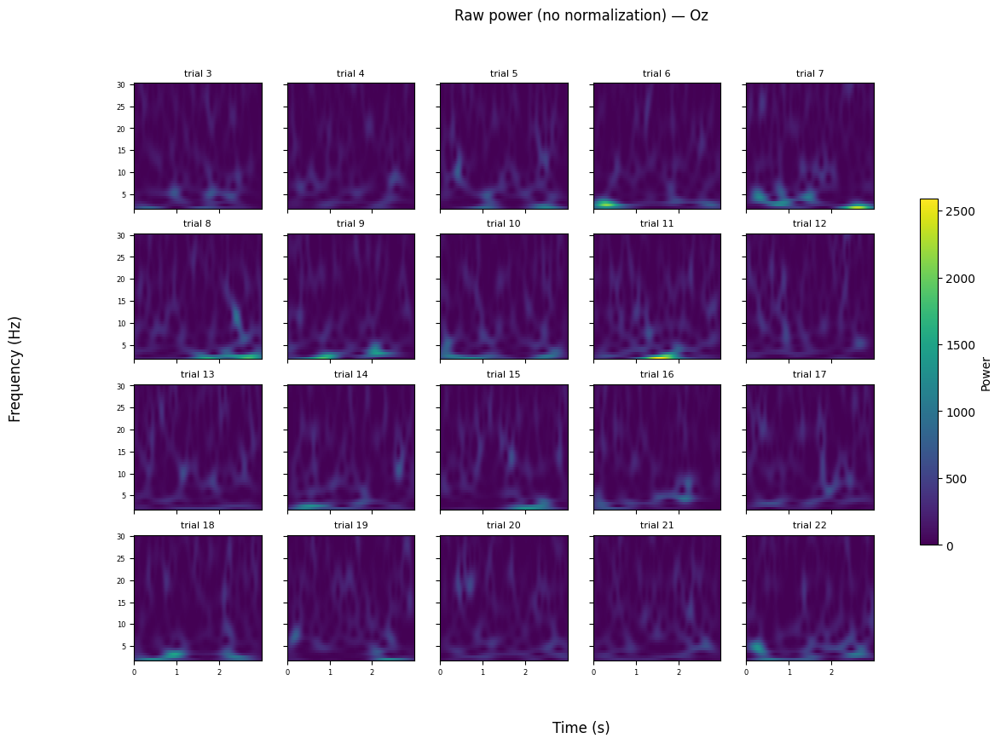

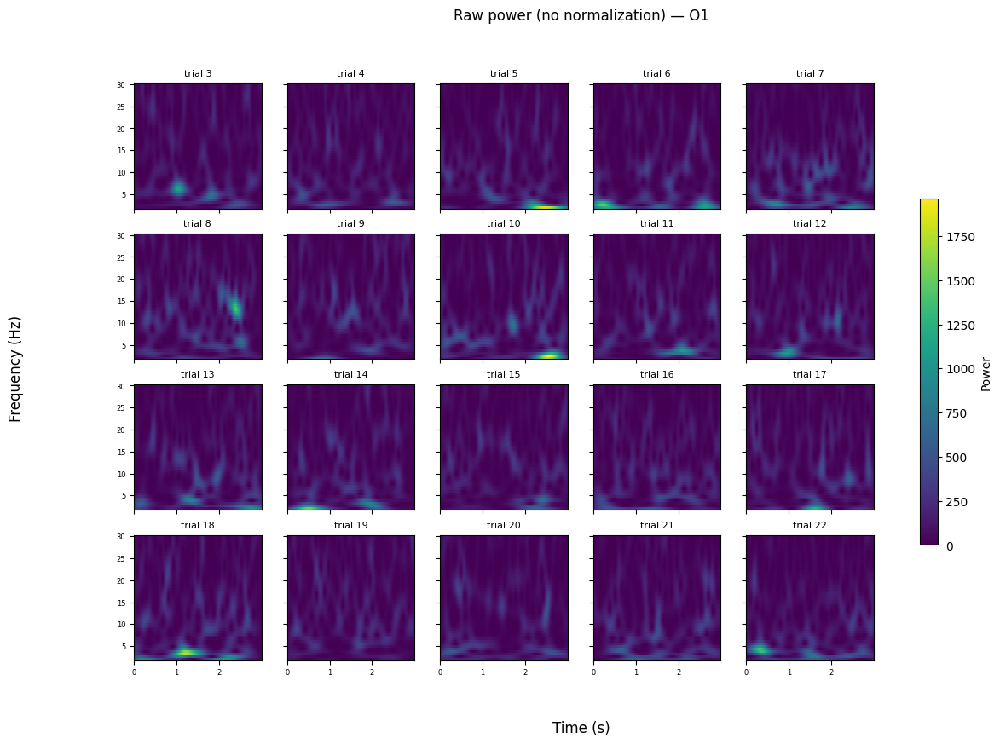

In [4]:
for ch in CHANNELS:
    plot_tf_grid(
        tf, frex, epochs.times, epochs.ch_names, channel=ch,
        trial_idx=stim_idx, symmetric=False, title=f"Raw power (no normalization) \u2014 {ch}",
    )

## 2. Baseline

Two views: the mean time-*resolved* baseline spectrogram (freq x time, averaged over the 3
baseline trials only — useful to look at), and the scalar (channel, freq) baseline
(`compute_baseline_stats`, pooled over time *and* baseline trials) that
`baseline_normalize` actually divides every pixel by.

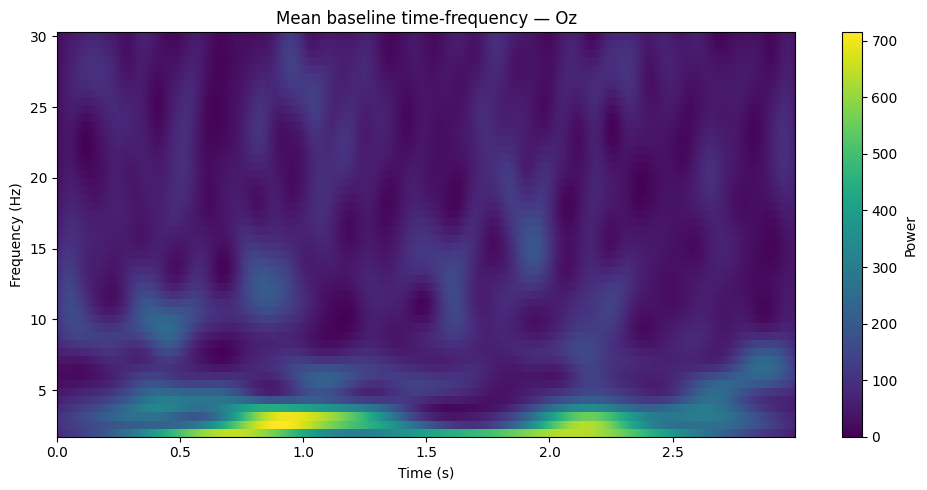

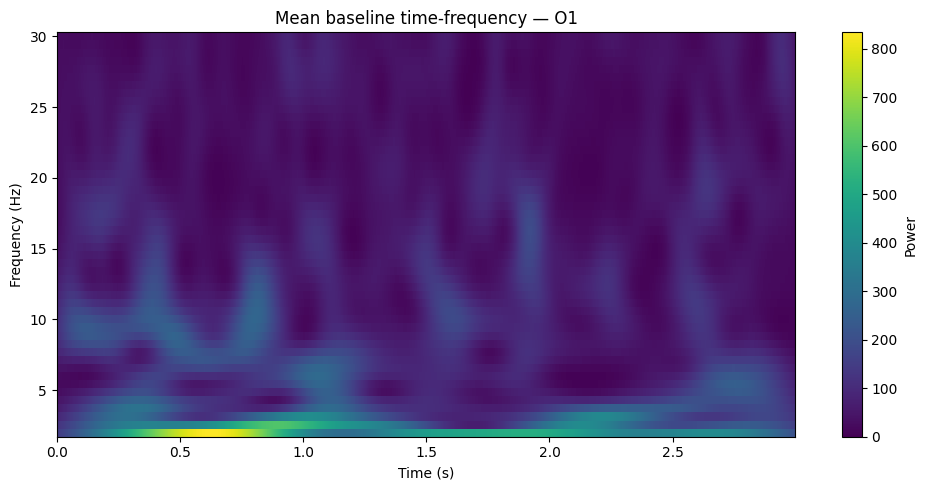

In [5]:
for ch in CHANNELS:
    plot_time_frequency(
        tf[:, :, :, baseline_mask], frex, epochs.times, epochs.ch_names, channel=ch,
        trial=None, cmap="viridis", vmin=0, title=f"Mean baseline time-frequency \u2014 {ch}",
    )

In [6]:
baseline_mean, baseline_std = compute_baseline_stats(tf, baseline_mask)  # (n_channels, n_freqs)

for ch in CHANNELS:
    ch_idx = epochs.ch_names.index(ch)
    print(f"{ch}: baseline mean at 10 Hz = {baseline_mean[ch_idx, frex == 10.0][0]:.4f}, "
          f"std = {baseline_std[ch_idx, frex == 10.0][0]:.4f}")

Oz: baseline mean at 10 Hz = 83.5179, std = 85.9850
O1: baseline mean at 10 Hz = 104.1494, std = 112.5907


## 3. Per-pixel baseline normalization — percent / dB / log

Each pixel (same frequency, same time) is normalized against the scalar baseline above.
One grid per (method, channel) — 6 grids. Diverging colormap centered at 0.

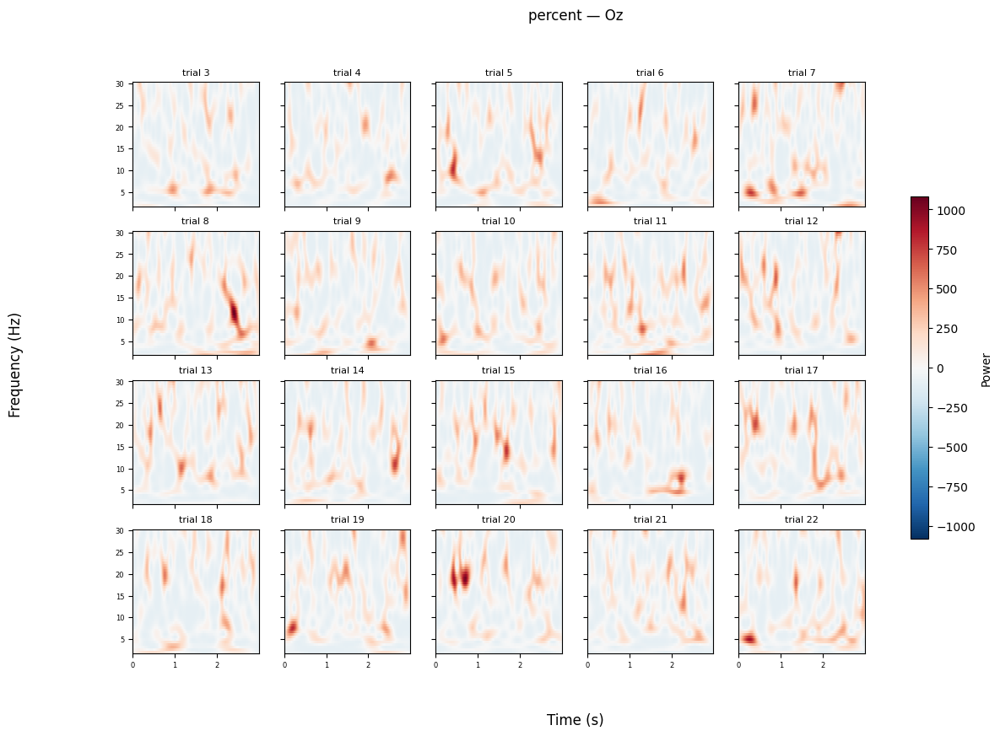

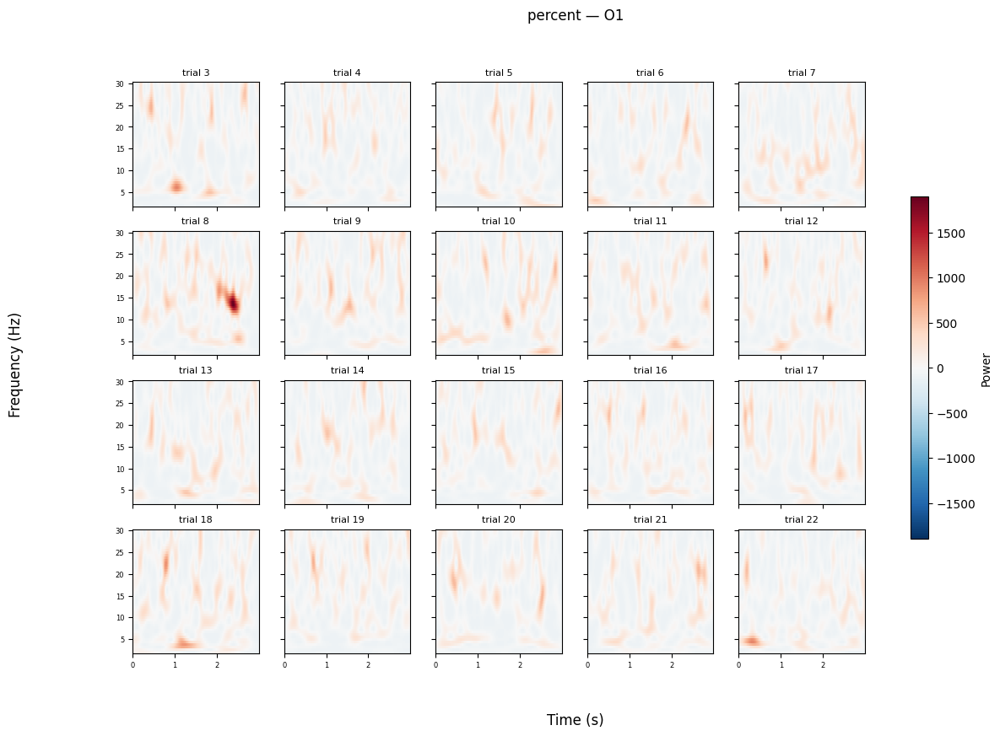

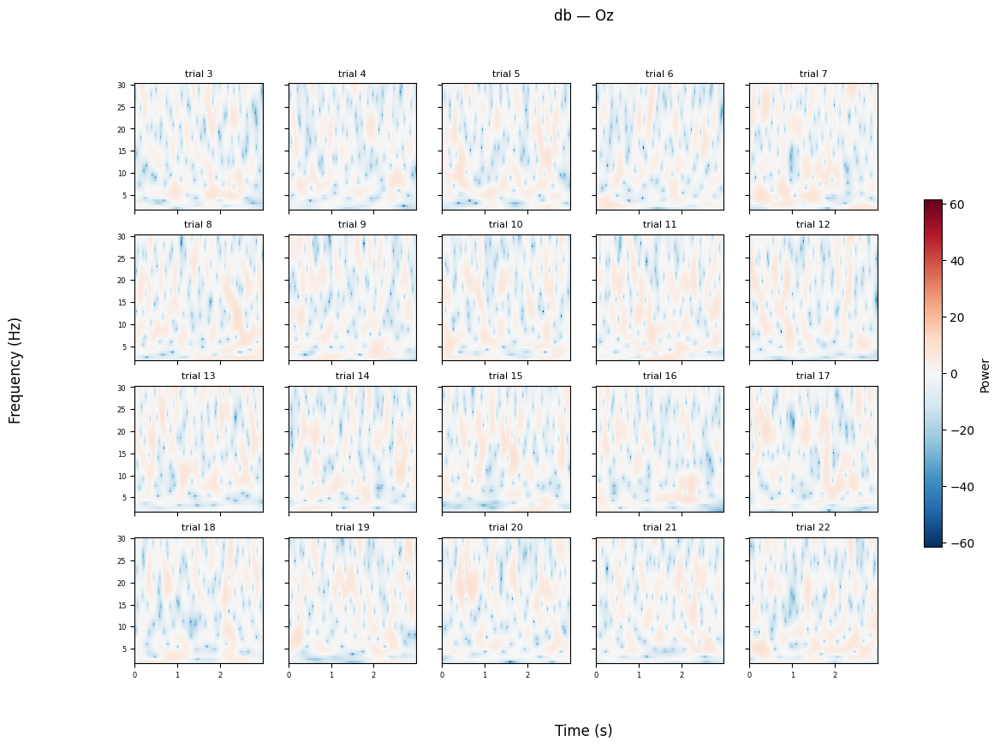

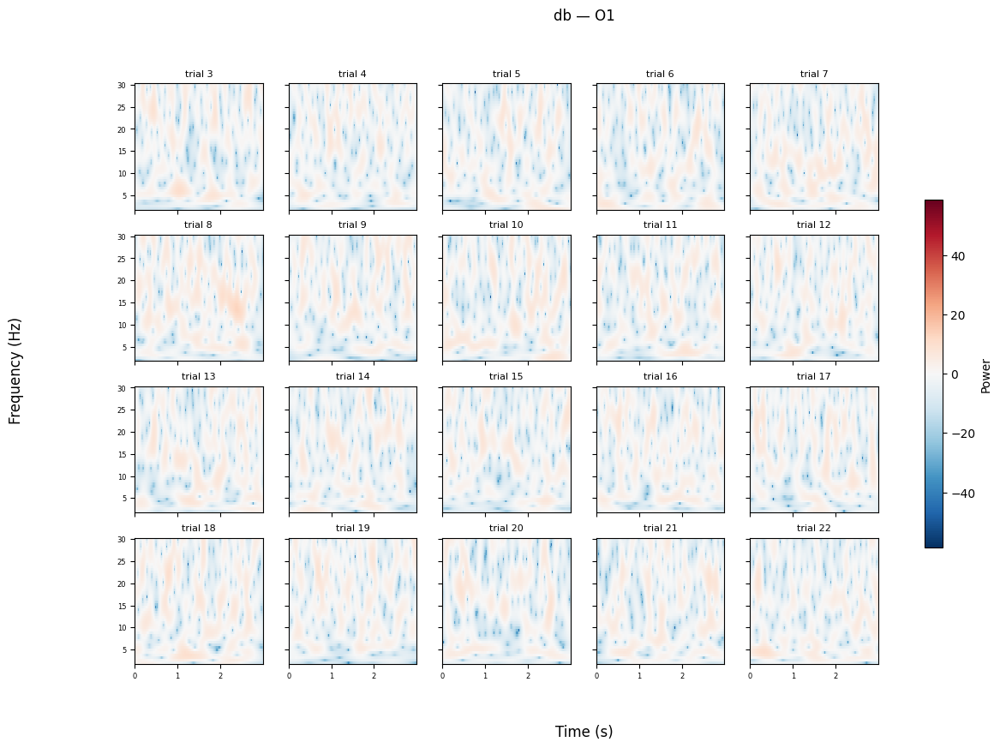

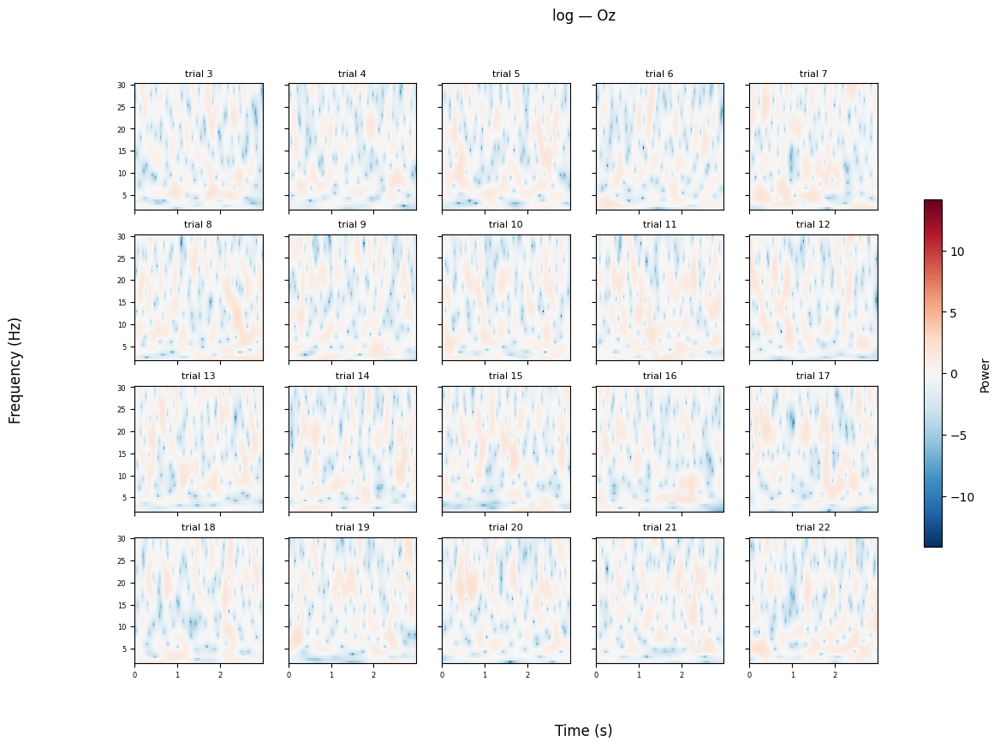

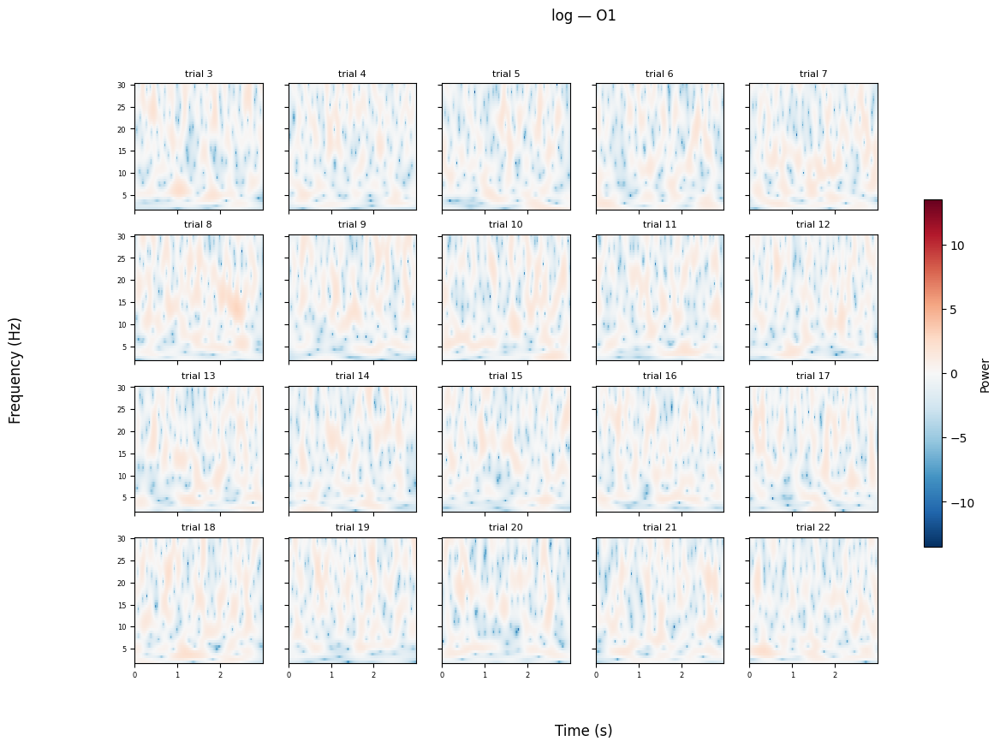

In [7]:
tf_norm = {}  # method -> tf array, reused in section 4
for method in METHODS:
    tf_norm[method] = baseline_normalize(tf, baseline_mean, baseline_std, method=method)
    for ch in CHANNELS:
        plot_tf_grid(
            tf_norm[method], frex, epochs.times, epochs.ch_names, channel=ch,
            trial_idx=stim_idx, symmetric=True, title=f"{method} \u2014 {ch}",
        )

### Custom color axis

The percent-change grid above auto-scales its color axis to the single largest outlier
across all 20 trials (here, one trial spikes to >1000%), which washes out contrast
everywhere else. `plot_tf_grid` takes explicit `vmin`/`vmax`/`cmap` to override that:

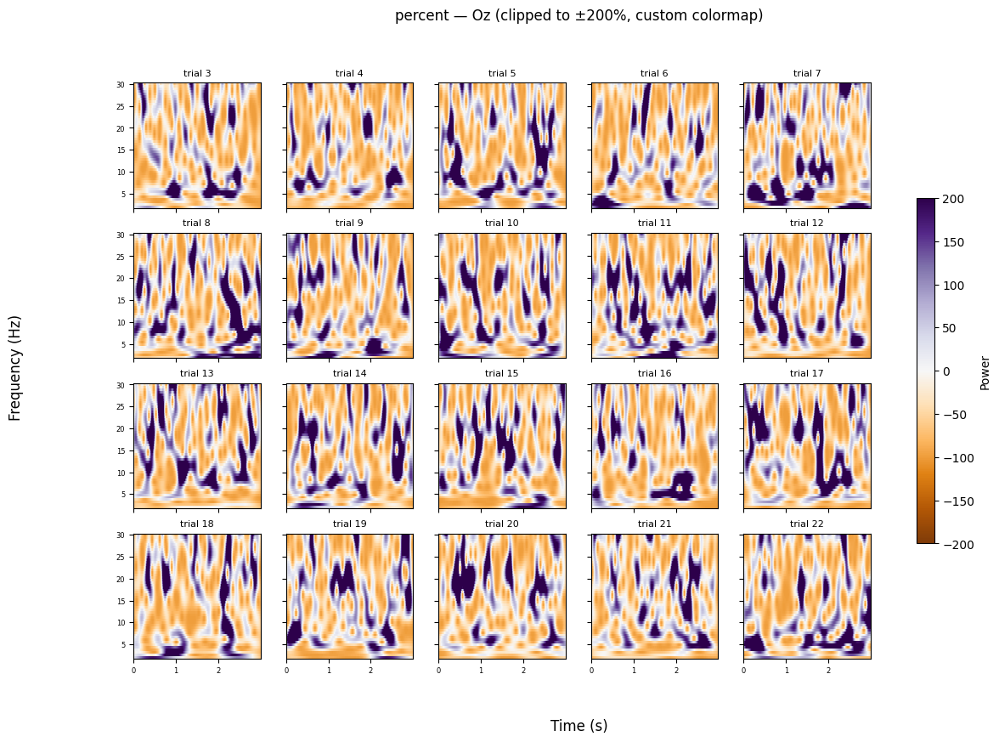

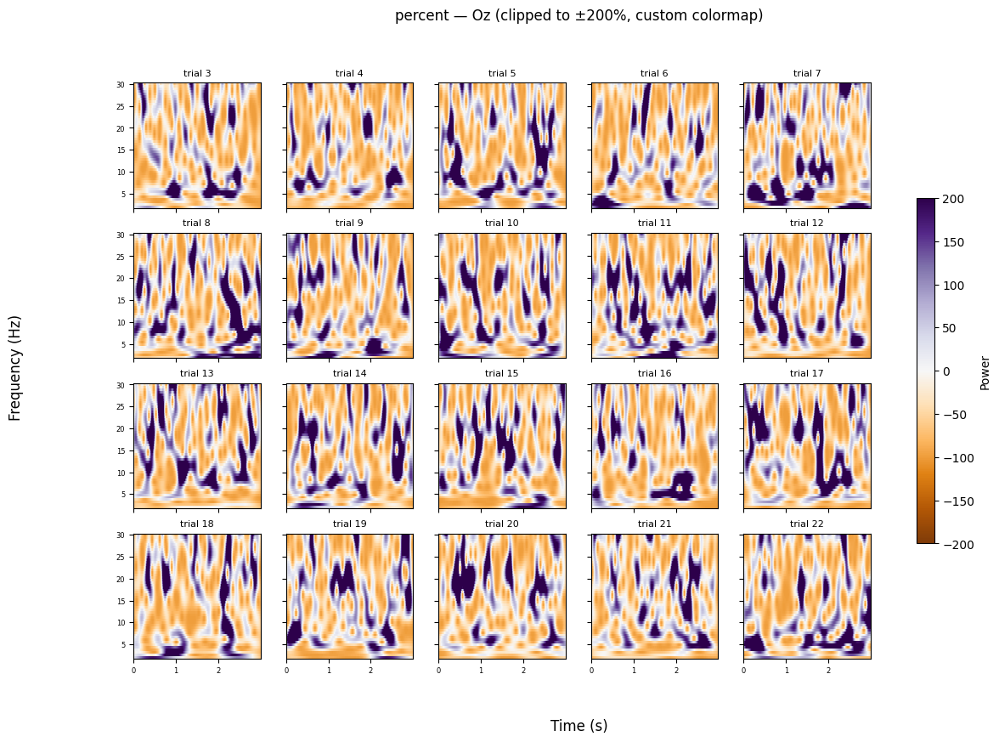

In [8]:
plot_tf_grid(
    tf_norm["percent"], frex, epochs.times, epochs.ch_names, channel="Oz",
    trial_idx=stim_idx, symmetric=True, cmap="PuOr", vmin=-200, vmax=200,
    title="percent — Oz (clipped to ±200%, custom colormap)",
)

## 4. Frequency-collapsed time courses — 10 Hz and 9–11 Hz

`band_power` (from `eeg.psd`, M3) generalizes to time-frequency arrays: given a single
channel's `(n_freqs, n_times, n_trials)` slice, it collapses only the frequency axis,
leaving a `(n_times, n_trials)` time course. Below: every (method, channel, frequency
definition) combination, each as a per-trial grid and an all-trials overlay.

/home/zevaz/projects/dataAnalysisCursor/src/eeg/viz.py:406: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(


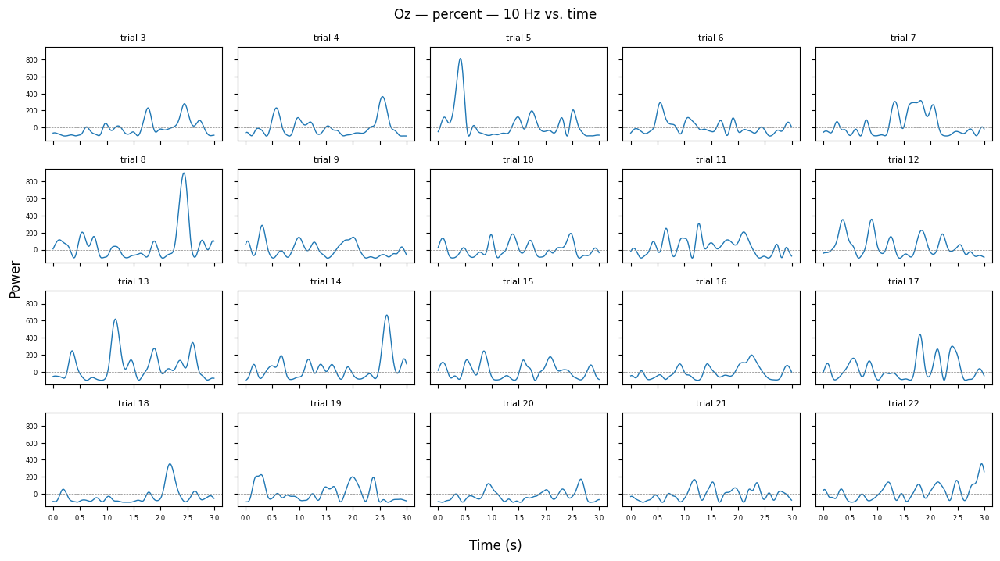

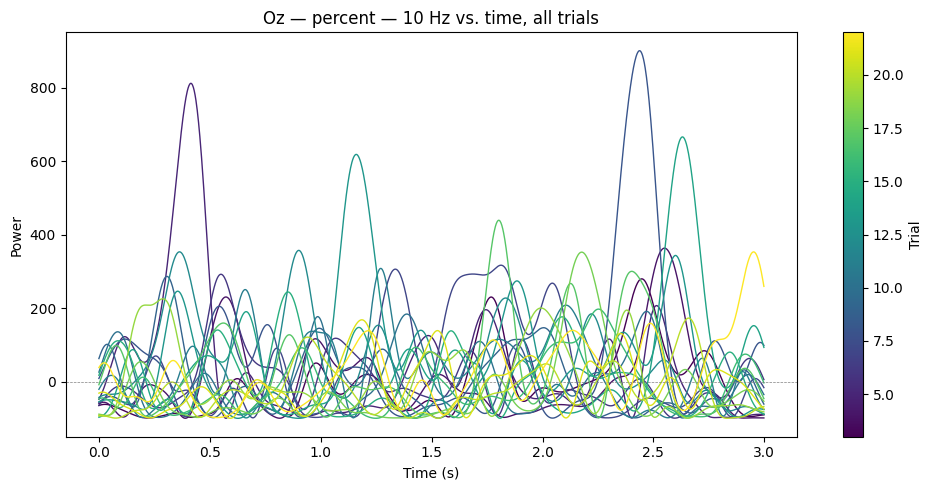

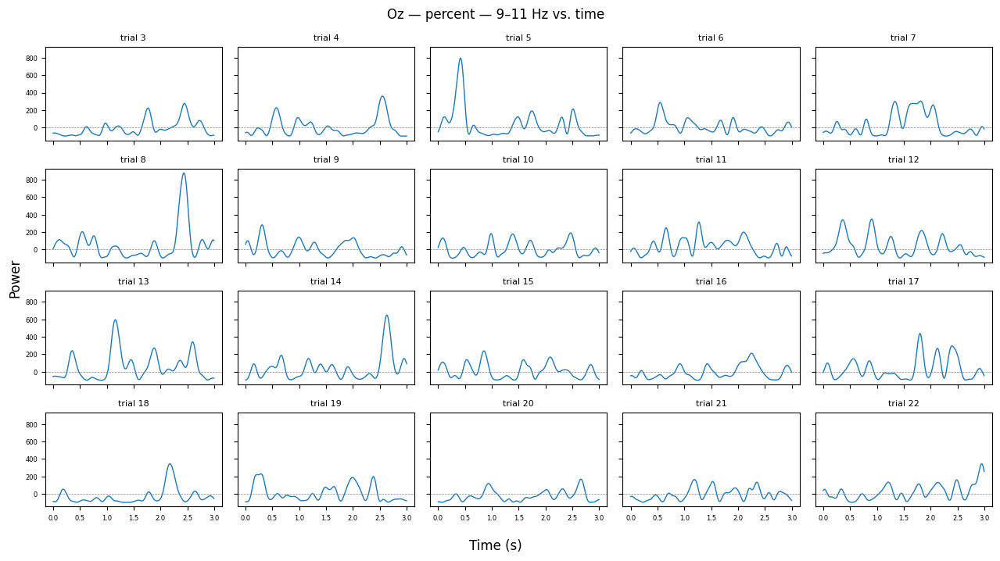

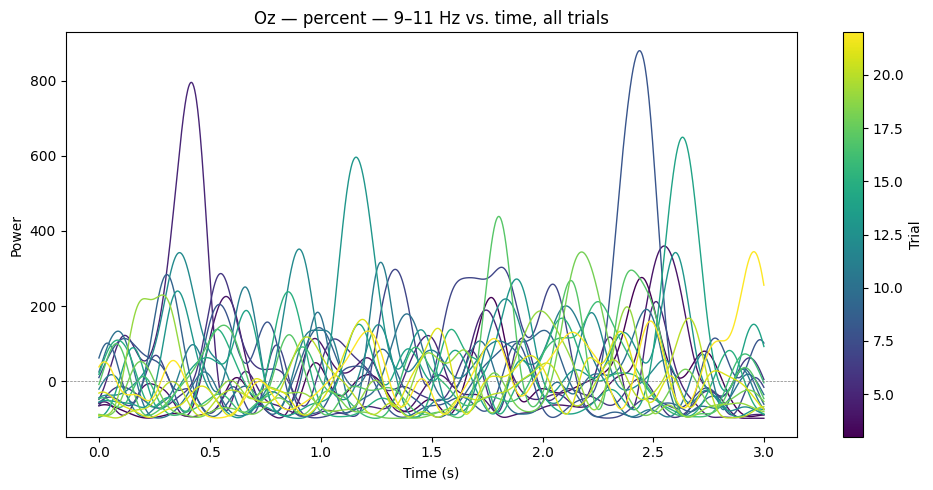

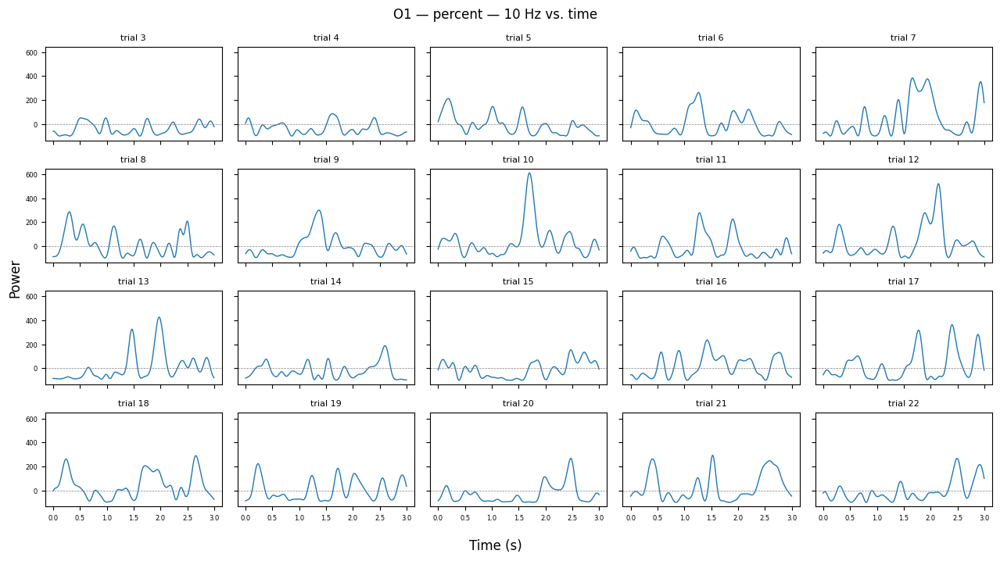

...

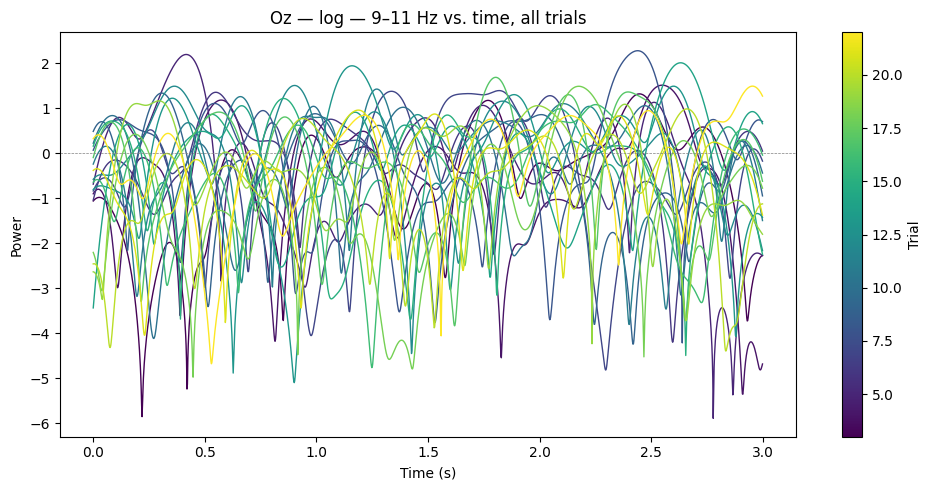

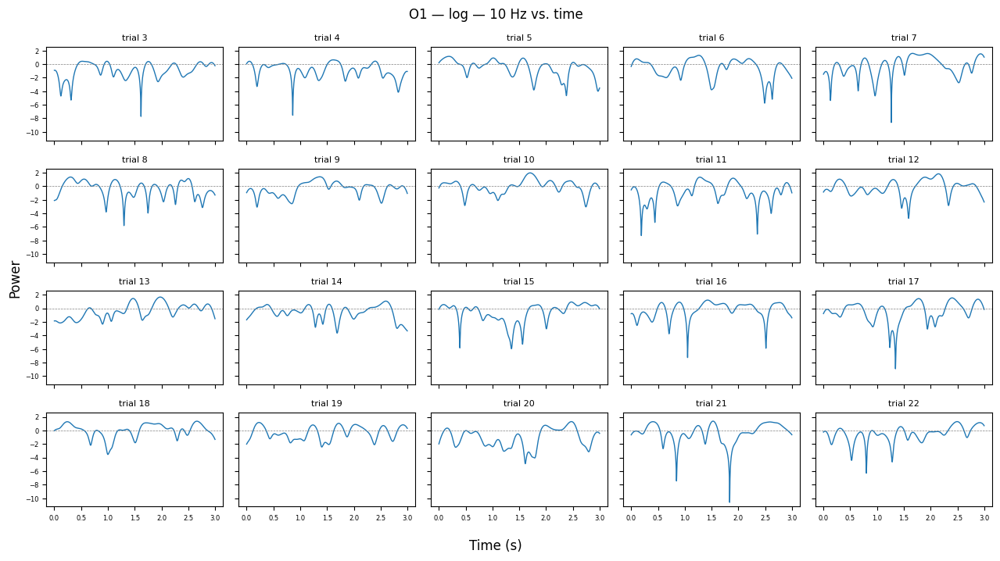

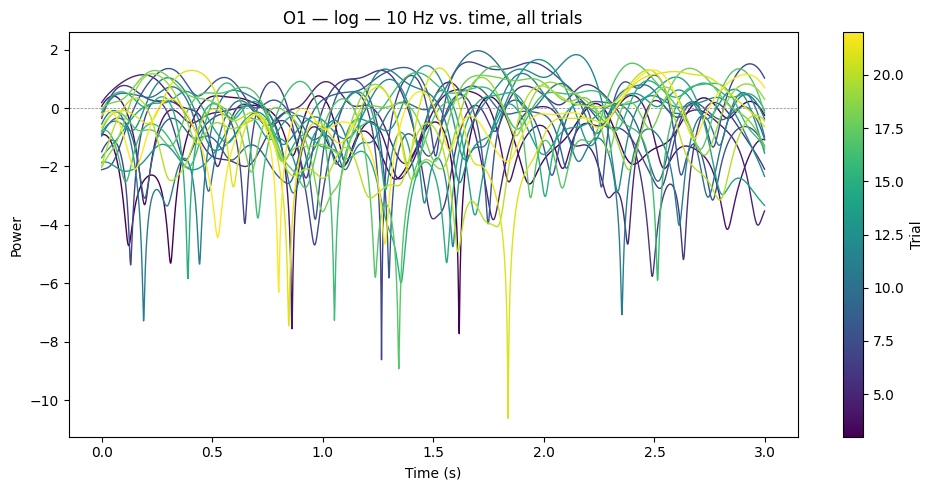

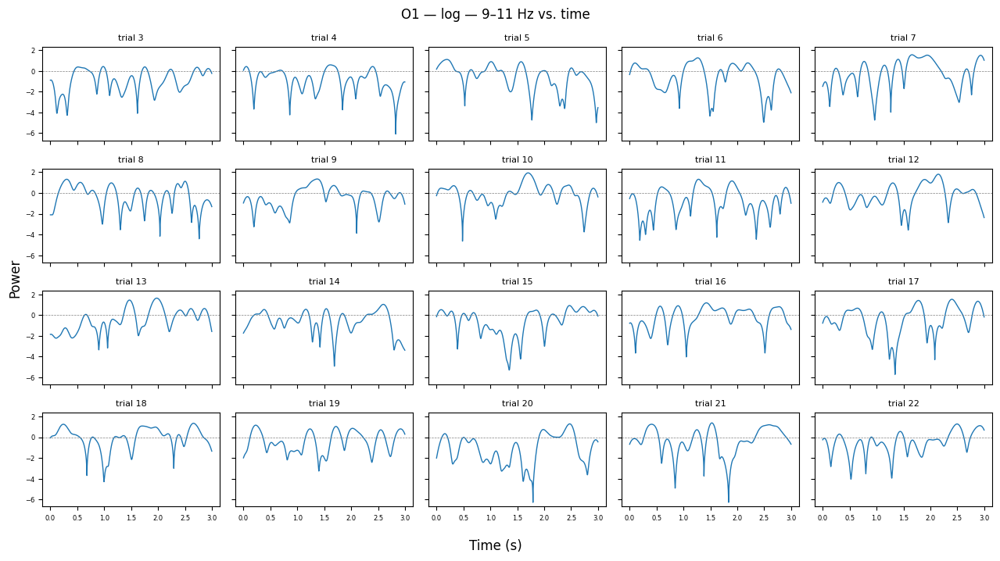

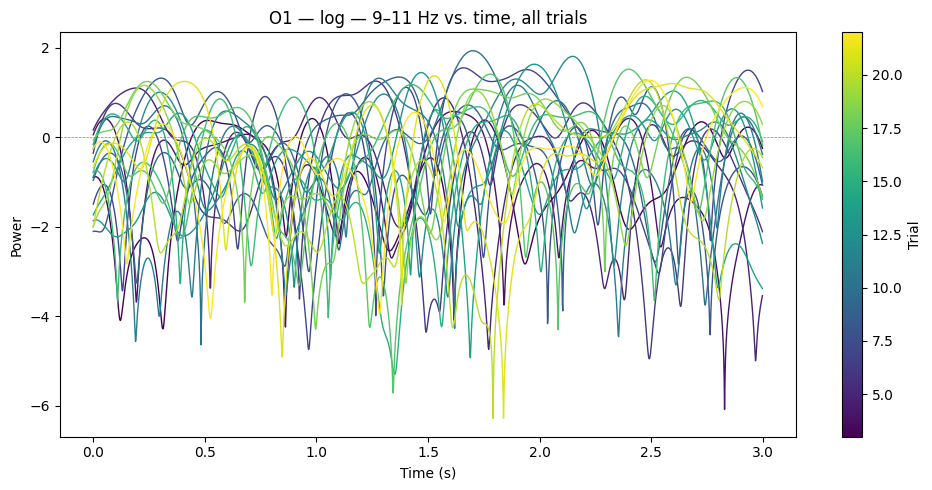

In [9]:
for method in METHODS:
    for ch in CHANNELS:
        ch_idx = epochs.ch_names.index(ch)
        for freq_label, freq_range in FREQ_DEFS:
            time_course = band_power(frex, tf_norm[method][ch_idx], freq_range)  # (n_times, n_trials)
            time_course_stim = time_course[:, stim_idx]

            label = f"{method} \u2014 {freq_label}"
            plot_time_course_grid(time_course_stim, epochs.times, channel=ch, freq_label=label, trial_idx=stim_idx)
            plot_time_course_overlay(time_course_stim, epochs.times, channel=ch, freq_label=label, trial_idx=stim_idx)